**Necessary Imports**

In [61]:
###
import tensorflow as tf
#import tensorflow_addons as tfa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import os
import glob
import shutil
import pathlib
import random

#model selection
from sklearn.model_selection import train_test_split

#data augumentation
import  cv2
import imgaug
import imageio
from imgaug import augmenters as iaa

##
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from keras.applications import VGG16
from keras.layers import Dense, GlobalMaxPool2D, BatchNormalization, Dropout
from keras.models import Model, Sequential
from keras.optimizers import Adam

from keras.callbacks import ModelCheckpoint
from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import EarlyStopping

from tensorflow.keras import layers
from tensorflow.keras.models import load_model

In [62]:
print(f"Tensorflow version: {tf.__version__}")

Tensorflow version: 2.12.0


**Drive Mount**

In [63]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [64]:
#Run from here
#Run from here
import os
x_train = []
y_train = []
x_train = np.load("/content/drive/MyDrive/ThesisExperimentsFinal/Dataset/FinalData/TrainData.npy")
y_train = np.load("/content/drive/MyDrive/ThesisExperimentsFinal/Dataset/FinalData/TrainLabels.npy")

x_val = []
y_val = []
x_val = np.load("/content/drive/MyDrive/ThesisExperimentsFinal/Dataset/FinalData/ValData.npy")
y_val = np.load("/content/drive/MyDrive/ThesisExperimentsFinal/Dataset/FinalData/ValLabels.npy")

x_test = []
y_test = []
x_test = np.load("/content/drive/MyDrive/ThesisExperimentsFinal/Dataset/FinalData/TestData.npy")
y_test = np.load("/content/drive/MyDrive/ThesisExperimentsFinal/Dataset/FinalData/TestLabels.npy")

print(f"x_train shape: {x_train .shape} - y_train shape: {y_train .shape}")
print(f"x_val shape: {x_val.shape} - y_val shape: {y_val.shape}")
print(f"x_test shape: {x_test.shape} - y_test shape: {y_test .shape}")

x_train shape: (18123, 110, 110, 3) - y_train shape: (18123,)
x_val shape: (648, 110, 110, 3) - y_val shape: (648,)
x_test shape: (812, 110, 110, 3) - y_test shape: (812,)


**Training Models**

# **Fine Tuned**

In [65]:
from keras.utils import to_categorical

y_test_one_hot = to_categorical(y_test, num_classes=5)

In [66]:
from tensorflow.keras.models import load_model
FT_densenet= load_model('/content/drive/MyDrive/ThesisExperimentsFinal/FineTunedandCostSensitive/Densenet169/model_densenet_ft.hdf5')


In [67]:
FT_densenet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1/conv (Conv2D)            (None, None, None,   9408        ['zero_padding2d[0][0]']         
                                64)                                                           

In [68]:
# Define class names dictionary
class_names = {0: 'Dyskeratotic', 1: 'Koilocytotic', 2: 'Metaplastic', 3: 'Parabasal', 4: 'Superficial_Intermediate'}

# Get the predicted class labels
y_pred = np.argmax(FT_densenet.predict(x_test), axis=-1)

filenames = []
for i in range(len(x_test)):
    filenames.append('image_'+str(i)+'.jpg')

# Create a dataframe with filename, actual class, predicted class, and "same" columns
df = pd.DataFrame()
df['filename'] = filenames
df['actual'] = [class_names[i] for i in y_test]
df['predicted'] = [class_names[i] for i in y_pred]
df['same'] = df['actual'] == df['predicted']

# Show the dataframe
print(df.head(800))


26/26 [==============================] - 40s 1s/step
          filename                    actual                 predicted  same
0      image_0.jpg              Dyskeratotic              Dyskeratotic  True
1      image_1.jpg              Dyskeratotic              Dyskeratotic  True
2      image_2.jpg              Dyskeratotic              Dyskeratotic  True
3      image_3.jpg              Dyskeratotic              Dyskeratotic  True
4      image_4.jpg              Dyskeratotic              Dyskeratotic  True
..             ...                       ...                       ...   ...
795  image_795.jpg  Superficial_Intermediate  Superficial_Intermediate  True
796  image_796.jpg  Superficial_Intermediate  Superficial_Intermediate  True
797  image_797.jpg  Superficial_Intermediate  Superficial_Intermediate  True
798  image_798.jpg  Superficial_Intermediate  Superficial_Intermediate  True
799  image_799.jpg  Superficial_Intermediate  Superficial_Intermediate  True

[800 rows x 4 columns]

In [69]:
# Create a dictionary to keep track of selected images for each class
selected_images = {}

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    actual_class = row['actual']
    same = row['same']
    
    # Check if the actual class and 'same' value meet the criteria
    if same and actual_class not in selected_images:
        selected_images[actual_class] = row['filename']

# Create a new dataframe with the selected images
selected_df = df[df['filename'].isin(selected_images.values())]

# Print the selected dataframe
print(selected_df)


          filename                    actual                 predicted  same
0      image_0.jpg              Dyskeratotic              Dyskeratotic  True
163  image_163.jpg              Koilocytotic              Koilocytotic  True
328  image_328.jpg               Metaplastic               Metaplastic  True
487  image_487.jpg                 Parabasal                 Parabasal  True
645  image_645.jpg  Superficial_Intermediate  Superficial_Intermediate  True


In [70]:
#check layers trainable
for i, layer in enumerate(FT_densenet.layers):
    print(i, layer.name, layer.output_shape, layer.trainable)

0 input_1 [(None, None, None, 3)] True
1 zero_padding2d (None, None, None, 3) True
2 conv1/conv (None, None, None, 64) True
3 conv1/bn (None, None, None, 64) True
4 conv1/relu (None, None, None, 64) True
5 zero_padding2d_1 (None, None, None, 64) True
6 pool1 (None, None, None, 64) True
7 conv2_block1_0_bn (None, None, None, 64) True
8 conv2_block1_0_relu (None, None, None, 64) True
9 conv2_block1_1_conv (None, None, None, 128) True
10 conv2_block1_1_bn (None, None, None, 128) True
11 conv2_block1_1_relu (None, None, None, 128) True
12 conv2_block1_2_conv (None, None, None, 32) True
13 conv2_block1_concat (None, None, None, 96) True
14 conv2_block2_0_bn (None, None, None, 96) True
15 conv2_block2_0_relu (None, None, None, 96) True
16 conv2_block2_1_conv (None, None, None, 128) True
17 conv2_block2_1_bn (None, None, None, 128) True
18 conv2_block2_1_relu (None, None, None, 128) True
19 conv2_block2_2_conv (None, None, None, 32) True
20 conv2_block2_concat (None, None, None, 128) True
21 

In [71]:
def flatten_model(model):
    if not any(hasattr(layer, 'layers') for layer in model.layers):
        return model  # No sub-model defined within this model
    inputs = None
    outputs = None
    for layer in model.layers:
        if inputs is None:
            inputs = layer.input
        if hasattr(layer, 'layers'):
            submodel = layer
            last_layer = submodel.layers[-1]
            outputs = last_layer.output  # Corrected line
        
        if outputs is None:
            outputs = layer
        else:
            outputs = layer(outputs)
    return tf.keras.Model(inputs=inputs, outputs=outputs)

flat_model = flatten_model(FT_densenet)


In [72]:
pip install tf-keras-vis


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [73]:
image_titles = ['Image']
from matplotlib import cm

Correct Images

In [74]:
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

replace2linear = ReplaceToLinear()

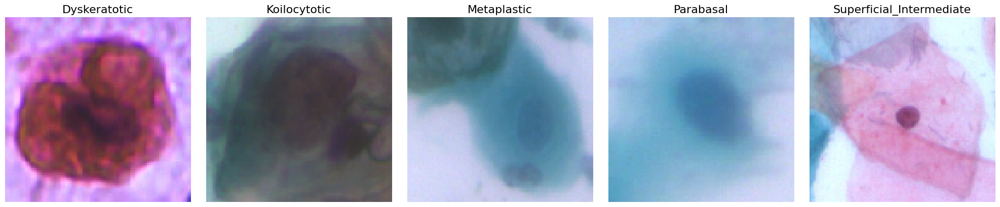

In [75]:
from keras.applications.densenet import preprocess_input
selected_indices = [0, 163, 328, 487, 797]
# Select images based on indices
selected_images = x_test[selected_indices]
selected_labels = [class_names[y_test[i]] for i in selected_indices]


X = preprocess_input(selected_images)

# Rendering
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))
for i in range(len(selected_indices)):
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()


In [76]:
y_values = [y_test[idx].item() for idx in selected_indices]
score = CategoricalScore(y_values)


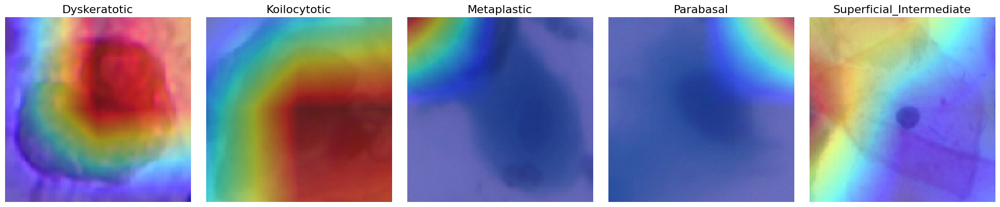

In [77]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

gradcam = Gradcam(FT_densenet,
                  model_modifier=replace2linear,
                  clone=True)
cam = gradcam(score,
              X,
              penultimate_layer=595)
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(20,4))
for i, title in enumerate(selected_labels):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

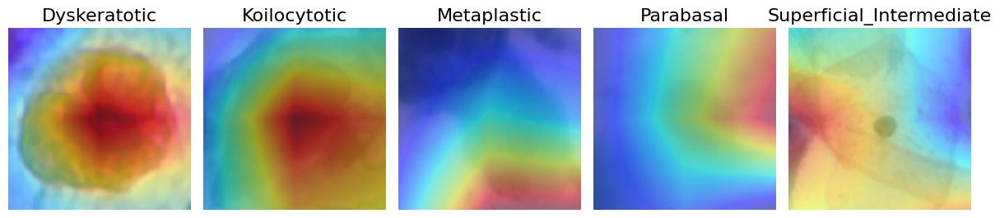

In [78]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(FT_densenet, model_modifier=replace2linear,clone=False)

# Generate heatmap with GradCAM++
grad_cam = gradcam(score, X, penultimate_layer=595)
# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap2 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap2, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

3/3 [==============================] - 8s 1s/step


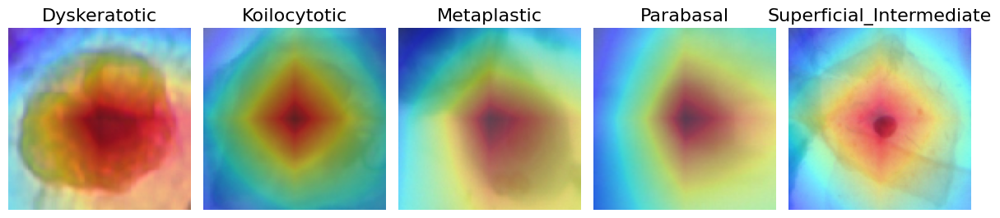

In [79]:
from tf_keras_vis.scorecam import Scorecam
# Create ScoreCAM object
scorecam = Scorecam(FT_densenet)

# Generate heatmap with Faster-ScoreCAM
grad_cam = scorecam(score,X,penultimate_layer=595,max_N=10)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap3 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap3, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

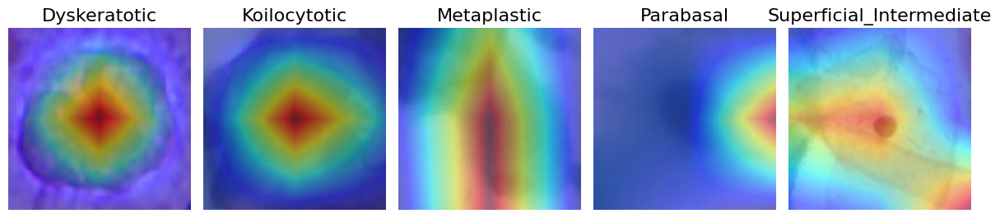

In [80]:
from tf_keras_vis.layercam import Layercam

layercam = Layercam(FT_densenet, model_modifier=replace2linear,clone = False)

# Generate heatmap with Faster-ScoreCAM
grad_cam = layercam(score,X,penultimate_layer=595)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap5 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap5, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [81]:
!pip install scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [82]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [83]:
from skimage import io
from skimage import transform
from tensorflow.keras.preprocessing import image
from skimage.util import img_as_float
def preprocess_img(img):
    img = img_as_float(img)
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return img

selected_images = []
selected_labels = []
for idx in selected_indices:
    img = x_test[idx]
    label = y_test[idx].item()
    img = preprocess_img(img)
    selected_images.append(img)
    selected_labels.append(label)

selected_images = np.vstack(selected_images)
selected_labels = np.array(selected_labels)

preds = FT_densenet.predict(selected_images)
probabilities = np.max(preds, axis=1)

for i in range(len(selected_indices)):
    print(f"Image {selected_indices[i]} - Label: {selected_labels[i]}, Probability: {probabilities[i]}")


1/1 [==============================] - 4s 4s/step
Image 0 - Label: 0, Probability: 1.5358350276947021
Image 163 - Label: 1, Probability: 1.6025886535644531
Image 328 - Label: 2, Probability: 1.5408682823181152
Image 487 - Label: 3, Probability: 1.663771152496338
Image 797 - Label: 4, Probability: 1.674891471862793


1/1 [==============================] - 0s 87ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 71ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 69ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 395ms/step


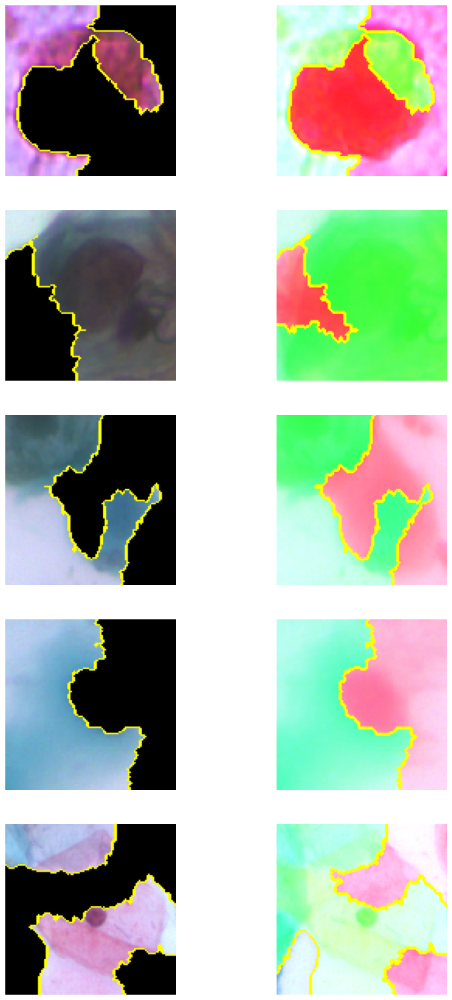

In [84]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

explainer = lime_image.LimeImageExplainer()

fig, axes = plt.subplots(5, 2, figsize=(12, 24))

for i, idx in enumerate(selected_indices):
    img = x_test[idx]
    label = y_test[idx]
    img = preprocess_img(img)
    preds = FT_densenet.predict(img)
    explanation = explainer.explain_instance(img[0].astype('double'), FT_densenet.predict, top_labels=5, hide_color=0, num_samples=1000)
    temp_1, mask1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
    temp_2, mask2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    ax1 = axes[i][0]
    ax2 = axes[i][1]
    ax1.imshow(mark_boundaries(temp_1, mask1))
    ax2.imshow(mark_boundaries(temp_2, mask2))
    ax1.axis('off')
    ax2.axis('off')

plt.show()


# Fine Tuned- Misclassified Images

In [85]:
# Create a dictionary to keep track of selected images for each class
selected_images = {}

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    actual_class = row['actual']
    same = row['same']
    
    # Check if the actual class and 'same' value meet the criteria
    if not same and actual_class not in selected_images:
        selected_images[actual_class] = row['filename']

# Create a new dataframe with the selected images
selected_df = df[df['filename'].isin(selected_images.values())]

# Print the selected dataframe
print(selected_df)



          filename                    actual     predicted   same
22    image_22.jpg              Dyskeratotic  Koilocytotic  False
184  image_184.jpg              Koilocytotic   Metaplastic  False
381  image_381.jpg               Metaplastic  Koilocytotic  False
749  image_749.jpg  Superficial_Intermediate   Metaplastic  False


In [86]:
# Create an empty dictionary to keep track of selected images for each class
selected_images = {}

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    actual_class = row['actual']
    predicted_class = row['predicted']
    same = row['same']

    # Check if the 'same' value is False
    if not same:
        # Check if the actual class exists as a key in the dictionary
        if actual_class in selected_images:
            # Append the filename, actual class, and predicted class to the list of values for that class
            selected_images[actual_class].append((row['filename'], actual_class, predicted_class))
        else:
            # Create a new key-value pair for the class and initialize it with the filename, actual class, and predicted class
            selected_images[actual_class] = [(row['filename'], actual_class, predicted_class)]

# Print the filename, actual class, and predicted class for each image
for class_name, image_info in selected_images.items():
    print(f"Class: {class_name}")
    for info in image_info:
        filename, actual_class, predicted_class = info
        print(f"Filename: {filename}, Actual Class: {actual_class}, Predicted Class: {predicted_class}")


Class: Dyskeratotic
Filename: image_22.jpg, Actual Class: Dyskeratotic, Predicted Class: Koilocytotic
Filename: image_28.jpg, Actual Class: Dyskeratotic, Predicted Class: Koilocytotic
Filename: image_78.jpg, Actual Class: Dyskeratotic, Predicted Class: Koilocytotic
Filename: image_158.jpg, Actual Class: Dyskeratotic, Predicted Class: Koilocytotic
Class: Koilocytotic
Filename: image_184.jpg, Actual Class: Koilocytotic, Predicted Class: Metaplastic
Filename: image_199.jpg, Actual Class: Koilocytotic, Predicted Class: Dyskeratotic
Filename: image_215.jpg, Actual Class: Koilocytotic, Predicted Class: Metaplastic
Filename: image_226.jpg, Actual Class: Koilocytotic, Predicted Class: Parabasal
Filename: image_227.jpg, Actual Class: Koilocytotic, Predicted Class: Dyskeratotic
Filename: image_233.jpg, Actual Class: Koilocytotic, Predicted Class: Metaplastic
Filename: image_244.jpg, Actual Class: Koilocytotic, Predicted Class: Metaplastic
Filename: image_314.jpg, Actual Class: Koilocytotic, Pred

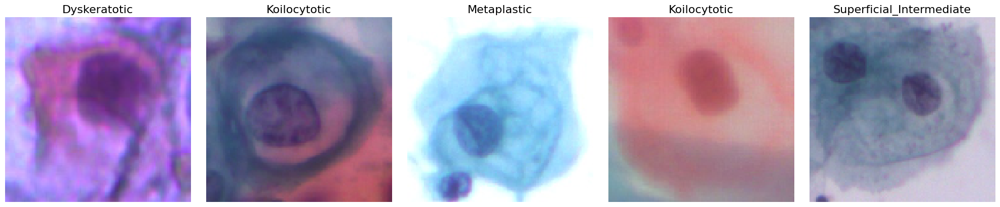

In [87]:
from tensorflow.keras.applications.densenet import preprocess_input
selected_indices = [22, 184, 381, 226, 658]
# Select images based on indices
selected_images = x_test[selected_indices]
selected_labels = [class_names[y_test[i]] for i in selected_indices]

# Preparing input data for ResNet50
X = preprocess_input(selected_images)

# Rendering
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))
for i in range(len(selected_indices)):
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [88]:
y_values = [y_test[idx].item() for idx in selected_indices]
score = CategoricalScore(y_values)

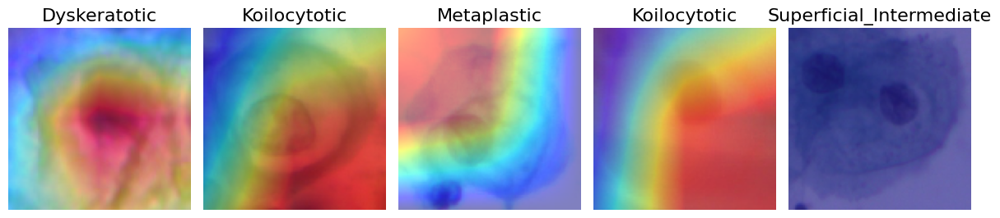

In [89]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

gradcam = Gradcam(FT_densenet,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
cam = gradcam(score,
              X,
              penultimate_layer=595)
# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

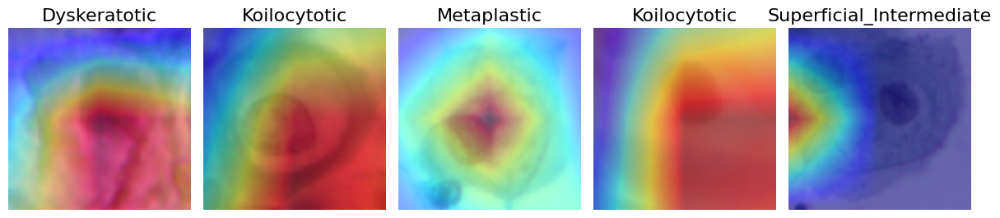

In [90]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(FT_densenet, model_modifier=replace2linear,clone=False)

# Generate heatmap with GradCAM++
grad_cam = gradcam(score, X, penultimate_layer=595)
# Render
#for i, title in enumerate(image_titles):
#    heatmap2 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)

f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap2 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap2, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

3/3 [==============================] - 3s 810ms/step


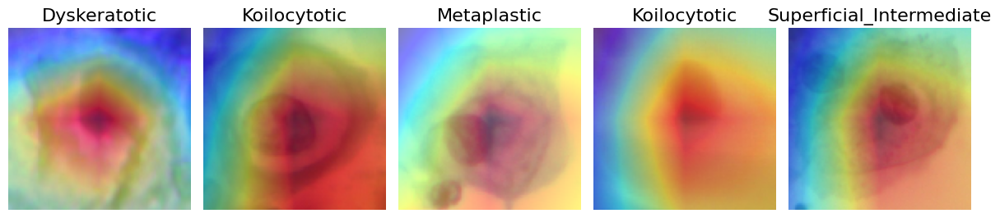

In [91]:
from tf_keras_vis.scorecam import Scorecam
# Create ScoreCAM object
scorecam = Scorecam(FT_densenet)

# Generate heatmap with Faster-ScoreCAM
grad_cam = scorecam(score,X,penultimate_layer=595,max_N=10)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap3 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap3, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

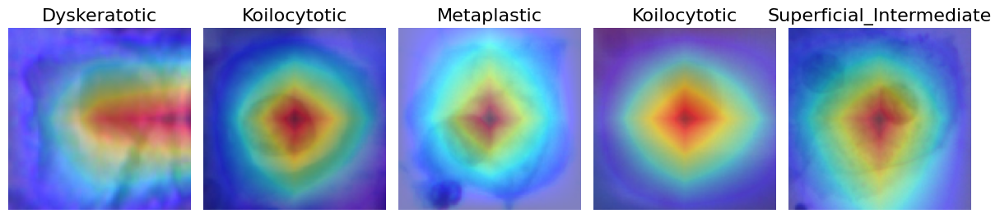

In [92]:
from tf_keras_vis.layercam import Layercam

layercam = Layercam(FT_densenet, model_modifier=replace2linear,clone = False)

# Generate heatmap with Faster-ScoreCAM
grad_cam = layercam(score,X,penultimate_layer=595)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap5 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap5, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [93]:
from skimage import io
from skimage import transform
from tensorflow.keras.preprocessing import image
from skimage.util import img_as_float
def preprocess_img(img):
    img = img_as_float(img)
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return img

selected_images = []
selected_labels = []
for idx in selected_indices:
    img = x_test[idx]
    label = y_test[idx].item()
    img = preprocess_img(img)
    selected_images.append(img)
    selected_labels.append(label)

selected_images = np.vstack(selected_images)
selected_labels = np.array(selected_labels)

preds = FT_densenet.predict(selected_images)
probabilities = np.max(preds, axis=1)

for i in range(len(selected_indices)):
    print(f"Image {selected_indices[i]} - Label: {selected_labels[i]}, Probability: {probabilities[i]}")


1/1 [==============================] - 0s 295ms/step
Image 22 - Label: 0, Probability: 1.5944222211837769
Image 184 - Label: 1, Probability: 1.5092030763626099
Image 381 - Label: 2, Probability: 1.7121803760528564
Image 226 - Label: 1, Probability: 1.568260908126831
Image 658 - Label: 4, Probability: 1.623741626739502


1/1 [==============================] - 0s 83ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 81ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 385ms/step


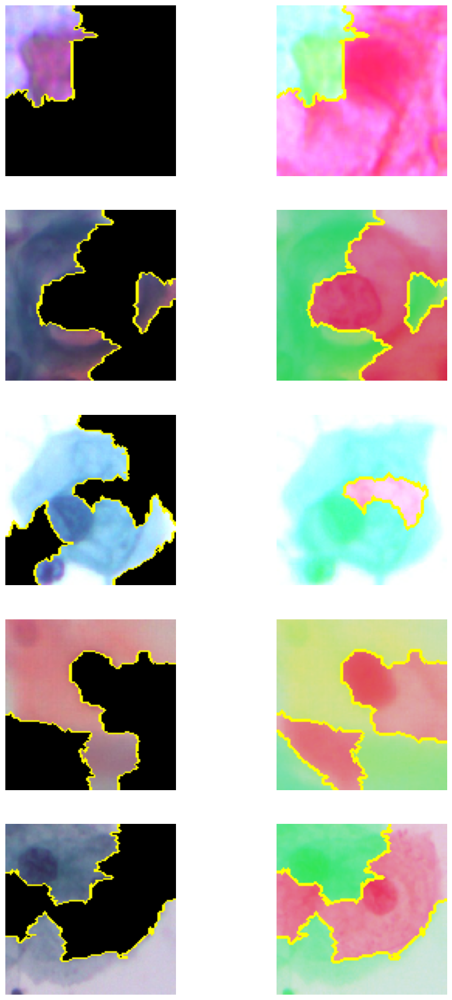

In [94]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

explainer = lime_image.LimeImageExplainer()

fig, axes = plt.subplots(5, 2, figsize=(12, 24))

for i, idx in enumerate(selected_indices):
    img = x_test[idx]
    label = y_test[idx]
    img = preprocess_img(img)
    preds = FT_densenet.predict(img)
    explanation = explainer.explain_instance(img[0].astype('double'), FT_densenet.predict, top_labels=5, hide_color=0, num_samples=1000)
    temp_1, mask1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
    temp_2, mask2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    ax1 = axes[i][0]
    ax2 = axes[i][1]
    ax1.imshow(mark_boundaries(temp_1, mask1))
    ax2.imshow(mark_boundaries(temp_2, mask2))
    ax1.axis('off')
    ax2.axis('off')

plt.show()


# Cost Sensitive

In [159]:
from tensorflow.keras.models import load_model
CS_densenet = load_model('/content/drive/MyDrive/ThesisExperimentsFinal/FineTunedandCostSensitive/Densenet169/modelCS_densenet_CS.hdf5')


In [160]:
CS_densenet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1/conv (Conv2D)            (None, None, None,   9408        ['zero_padding2d[0][0]']         
                                64)                                                           

In [161]:
# Define class names dictionary
class_names = {0: 'Dyskeratotic', 1: 'Koilocytotic', 2: 'Metaplastic', 3: 'Parabasal', 4: 'Superficial_Intermediate'}

# Get the predicted class labels
y_pred = np.argmax(CS_densenet.predict(x_test), axis=-1)

filenames = []
for i in range(len(x_test)):
    filenames.append('image_'+str(i)+'.jpg')

# Create a dataframe with filename, actual class, predicted class, and "same" columns
df = pd.DataFrame()
df['filename'] = filenames
df['actual'] = [class_names[i] for i in y_test]
df['predicted'] = [class_names[i] for i in y_pred]
df['same'] = df['actual'] == df['predicted']

# Show the dataframe
print(df.head(100))


26/26 [==============================] - 48s 2s/step
        filename        actual     predicted  same
0    image_0.jpg  Dyskeratotic  Dyskeratotic  True
1    image_1.jpg  Dyskeratotic  Dyskeratotic  True
2    image_2.jpg  Dyskeratotic  Dyskeratotic  True
3    image_3.jpg  Dyskeratotic  Dyskeratotic  True
4    image_4.jpg  Dyskeratotic  Dyskeratotic  True
..           ...           ...           ...   ...
95  image_95.jpg  Dyskeratotic  Dyskeratotic  True
96  image_96.jpg  Dyskeratotic  Dyskeratotic  True
97  image_97.jpg  Dyskeratotic  Dyskeratotic  True
98  image_98.jpg  Dyskeratotic  Dyskeratotic  True
99  image_99.jpg  Dyskeratotic  Dyskeratotic  True

[100 rows x 4 columns]


In [162]:
# Create a dictionary to keep track of selected images for each class
selected_images = {}

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    actual_class = row['actual']
    same = row['same']
    
    # Check if the actual class and 'same' value meet the criteria
    if same and actual_class not in selected_images:
        selected_images[actual_class] = row['filename']

# Create a new dataframe with the selected images
selected_df = df[df['filename'].isin(selected_images.values())]

# Print the selected dataframe
print(selected_df)


          filename                    actual                 predicted  same
0      image_0.jpg              Dyskeratotic              Dyskeratotic  True
163  image_163.jpg              Koilocytotic              Koilocytotic  True
328  image_328.jpg               Metaplastic               Metaplastic  True
487  image_487.jpg                 Parabasal                 Parabasal  True
645  image_645.jpg  Superficial_Intermediate  Superficial_Intermediate  True


In [163]:
#check layers trainable
for i, layer in enumerate(CS_densenet.layers):
    print(i, layer.name, layer.output_shape, layer.trainable)

0 input_1 [(None, None, None, 3)] True
1 zero_padding2d (None, None, None, 3) True
2 conv1/conv (None, None, None, 64) True
3 conv1/bn (None, None, None, 64) True
4 conv1/relu (None, None, None, 64) True
5 zero_padding2d_1 (None, None, None, 64) True
6 pool1 (None, None, None, 64) True
7 conv2_block1_0_bn (None, None, None, 64) True
8 conv2_block1_0_relu (None, None, None, 64) True
9 conv2_block1_1_conv (None, None, None, 128) True
10 conv2_block1_1_bn (None, None, None, 128) True
11 conv2_block1_1_relu (None, None, None, 128) True
12 conv2_block1_2_conv (None, None, None, 32) True
13 conv2_block1_concat (None, None, None, 96) True
14 conv2_block2_0_bn (None, None, None, 96) True
15 conv2_block2_0_relu (None, None, None, 96) True
16 conv2_block2_1_conv (None, None, None, 128) True
17 conv2_block2_1_bn (None, None, None, 128) True
18 conv2_block2_1_relu (None, None, None, 128) True
19 conv2_block2_2_conv (None, None, None, 32) True
20 conv2_block2_concat (None, None, None, 128) True
21 

In [164]:
def flatten_model(model):
    if not any(hasattr(layer, 'layers') for layer in model.layers):
        return model  # No sub-model defined within this model
    inputs = None
    outputs = None
    for layer in model.layers:
        if inputs is None:
            inputs = layer.input
        if hasattr(layer, 'layers'):
            submodel = layer
            last_layer = submodel.layers[-1]
            outputs = last_layer.output  # Corrected line
        
        if outputs is None:
            outputs = layer
        else:
            outputs = layer(outputs)
    return tf.keras.Model(inputs=inputs, outputs=outputs)

flat_model = flatten_model(CS_densenet)


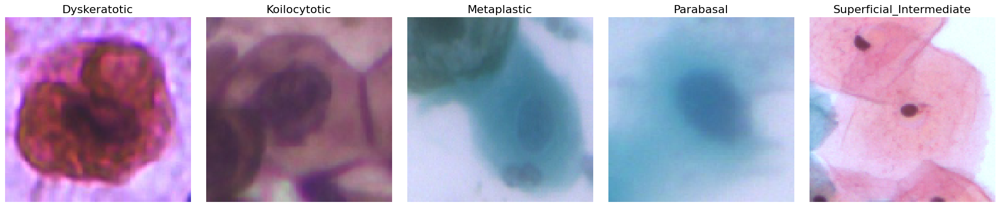

In [165]:
from tensorflow.keras.applications.densenet import preprocess_input
selected_indices = [0, 171, 328, 487, 645]
# Select images based on indices
selected_images = x_test[selected_indices]
selected_labels = [class_names[y_test[i]] for i in selected_indices]

X = preprocess_input(selected_images)

# Rendering
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))
for i in range(len(selected_indices)):
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [166]:
y_values = [y_test[idx].item() for idx in selected_indices]
score = CategoricalScore(y_values)

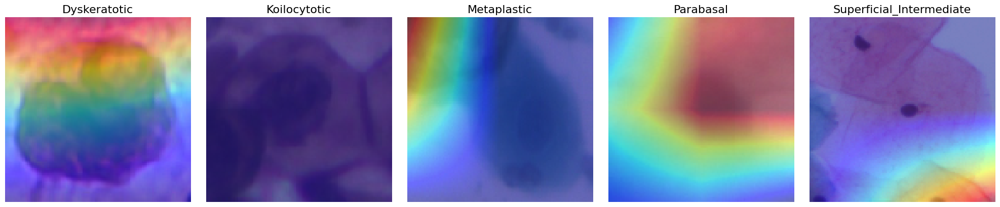

In [167]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

gradcam = Gradcam(CS_densenet,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
cam = gradcam(score,
              X,
              penultimate_layer=594)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))
for i, title in enumerate(selected_labels):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

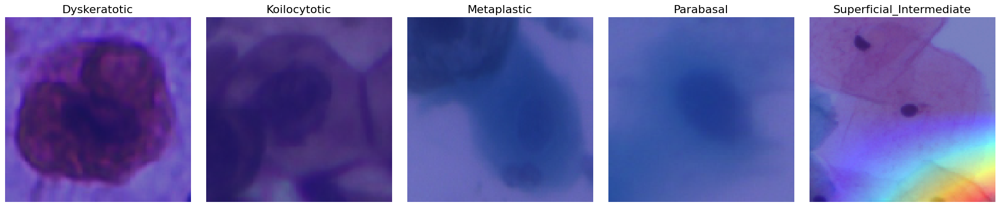

In [168]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(CS_densenet, model_modifier=replace2linear,clone=False)

# Generate heatmap with GradCAM
cam = gradcam(score,
              X,
              penultimate_layer=-1)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))
for i, title in enumerate(selected_labels):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

3/3 [==============================] - 7s 1s/step


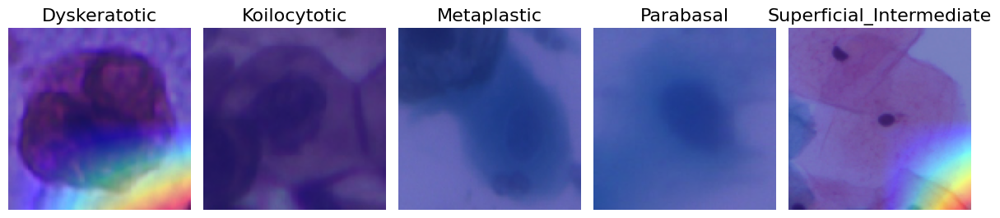

In [169]:
from tf_keras_vis.scorecam import Scorecam
# Create ScoreCAM object
scorecam = Scorecam(CS_densenet)

# Generate heatmap with Faster-ScoreCAM
grad_cam = scorecam(score,X,penultimate_layer=595,max_N=10)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap3 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap3, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

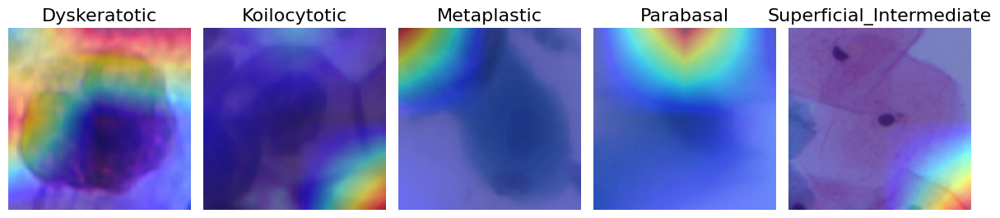

In [170]:
from tf_keras_vis.layercam import Layercam

layercam = Layercam(CS_densenet, model_modifier=replace2linear,clone = False)

# Generate heatmap with Faster-ScoreCAM
grad_cam = layercam(score,X,penultimate_layer=595)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap5 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap5, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [107]:
from skimage import io
from skimage import transform
from tensorflow.keras.preprocessing import image
from skimage.util import img_as_float
def preprocess_img(img):
    img = img_as_float(img)
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return img

selected_images = []
selected_labels = []
for idx in selected_indices:
    img = x_test[idx]
    label = y_test[idx].item()
    img = preprocess_img(img)
    selected_images.append(img)
    selected_labels.append(label)

selected_images = np.vstack(selected_images)
selected_labels = np.array(selected_labels)

preds = CS_densenet.predict(selected_images)
probabilities = np.max(preds, axis=1)

for i in range(len(selected_indices)):
    print(f"Image {selected_indices[i]} - Label: {selected_labels[i]}, Probability: {probabilities[i]}")


1/1 [==============================] - 4s 4s/step
Image 0 - Label: 0, Probability: 1.966352939605713
Image 163 - Label: 1, Probability: 2.157710075378418
Image 328 - Label: 2, Probability: 2.133465528488159
Image 487 - Label: 3, Probability: 2.2728915214538574
Image 645 - Label: 4, Probability: 2.296205759048462


1/1 [==============================] - 0s 77ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 78ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 73ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 78ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 374ms/step


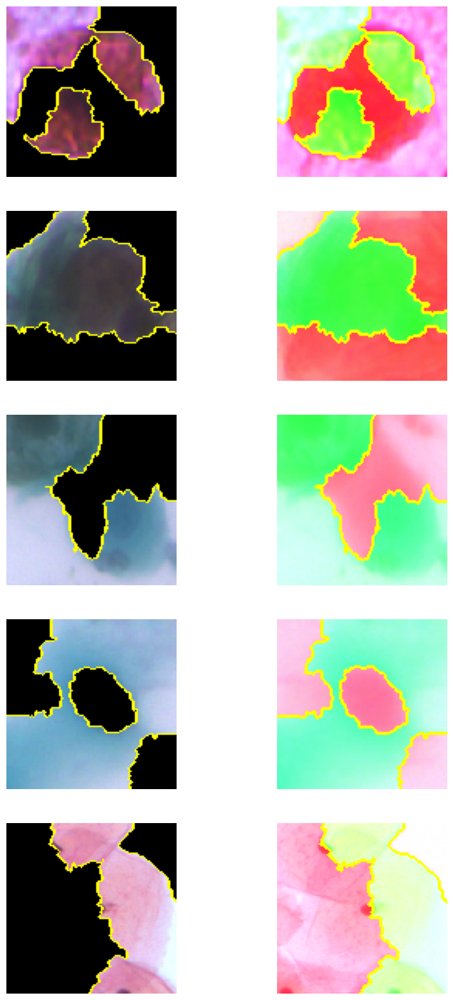

In [108]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

explainer = lime_image.LimeImageExplainer()

fig, axes = plt.subplots(5, 2, figsize=(10, 20))

for i, idx in enumerate(selected_indices):
    img = x_test[idx]
    label = y_test[idx]
    img = preprocess_img(img)
    preds = CS_densenet.predict(img)
    explanation = explainer.explain_instance(img[0].astype('double'), CS_densenet.predict, top_labels=5, hide_color=0, num_samples=1000)
    temp_1, mask1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
    temp_2, mask2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    ax1 = axes[i][0]
    ax2 = axes[i][1]
    ax1.imshow(mark_boundaries(temp_1, mask1))
    ax2.imshow(mark_boundaries(temp_2, mask2))
    ax1.axis('off')
    ax2.axis('off')

plt.show()


# Cost Sensitive-Misclassified

In [109]:
# Create a dictionary to keep track of selected images for each class
selected_images = {}

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    actual_class = row['actual']
    same = row['same']
    
    # Check if the actual class and 'same' value meet the criteria
    if not same and actual_class not in selected_images:
        selected_images[actual_class] = row['filename']

# Create a new dataframe with the selected images
selected_df = df[df['filename'].isin(selected_images.values())]

# Print the selected dataframe
print(selected_df)


          filename        actual     predicted   same
17    image_17.jpg  Dyskeratotic  Koilocytotic  False
174  image_174.jpg  Koilocytotic  Dyskeratotic  False
430  image_430.jpg   Metaplastic  Koilocytotic  False


In [110]:
# Create an empty dictionary to keep track of selected images for each class
selected_images = {}

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    actual_class = row['actual']
    predicted_class = row['predicted']
    same = row['same']

    # Check if the 'same' value is False
    if not same:
        # Check if the actual class exists as a key in the dictionary
        if actual_class in selected_images:
            # Append the filename, actual class, and predicted class to the list of values for that class
            selected_images[actual_class].append((row['filename'], actual_class, predicted_class))
        else:
            # Create a new key-value pair for the class and initialize it with the filename, actual class, and predicted class
            selected_images[actual_class] = [(row['filename'], actual_class, predicted_class)]

# Print the filename, actual class, and predicted class for each image
for class_name, image_info in selected_images.items():
    print(f"Class: {class_name}")
    for info in image_info:
        filename, actual_class, predicted_class = info
        print(f"Filename: {filename}, Actual Class: {actual_class}, Predicted Class: {predicted_class}")


Class: Dyskeratotic
Filename: image_17.jpg, Actual Class: Dyskeratotic, Predicted Class: Koilocytotic
Filename: image_22.jpg, Actual Class: Dyskeratotic, Predicted Class: Koilocytotic
Filename: image_32.jpg, Actual Class: Dyskeratotic, Predicted Class: Koilocytotic
Filename: image_158.jpg, Actual Class: Dyskeratotic, Predicted Class: Koilocytotic
Class: Koilocytotic
Filename: image_174.jpg, Actual Class: Koilocytotic, Predicted Class: Dyskeratotic
Filename: image_199.jpg, Actual Class: Koilocytotic, Predicted Class: Dyskeratotic
Filename: image_215.jpg, Actual Class: Koilocytotic, Predicted Class: Metaplastic
Filename: image_226.jpg, Actual Class: Koilocytotic, Predicted Class: Dyskeratotic
Filename: image_227.jpg, Actual Class: Koilocytotic, Predicted Class: Dyskeratotic
Filename: image_244.jpg, Actual Class: Koilocytotic, Predicted Class: Metaplastic
Filename: image_254.jpg, Actual Class: Koilocytotic, Predicted Class: Parabasal
Filename: image_314.jpg, Actual Class: Koilocytotic, Pr

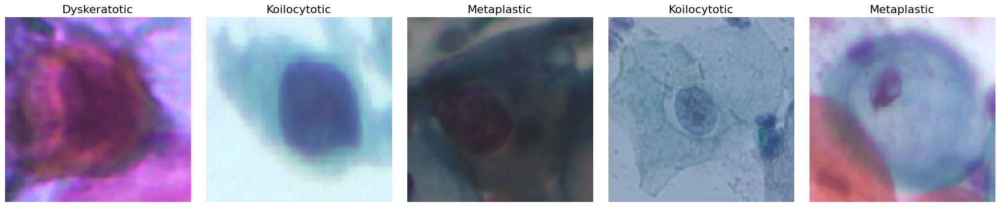

In [111]:
from tensorflow.keras.applications.densenet import preprocess_input
selected_indices = [17, 174, 430, 254, 457]
# Select images based on indices
selected_images = x_test[selected_indices]
selected_labels = [class_names[y_test[i]] for i in selected_indices]

# Preparing input data for ResNet50
X = preprocess_input(selected_images)

# Rendering
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))
for i in range(len(selected_indices)):
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [112]:
y_values = [y_test[idx].item() for idx in selected_indices]
score = CategoricalScore(y_values)

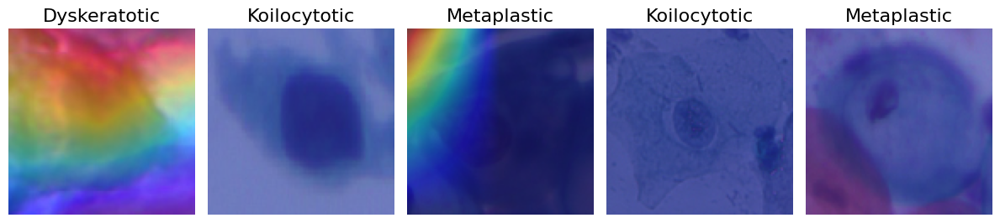

In [113]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

gradcam = Gradcam(CS_densenet,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
cam = gradcam(score,
              X,
              penultimate_layer=595)

## Since v0.6.0, calling `normalize()` is NOT necessary.
# cam = normalize(cam)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

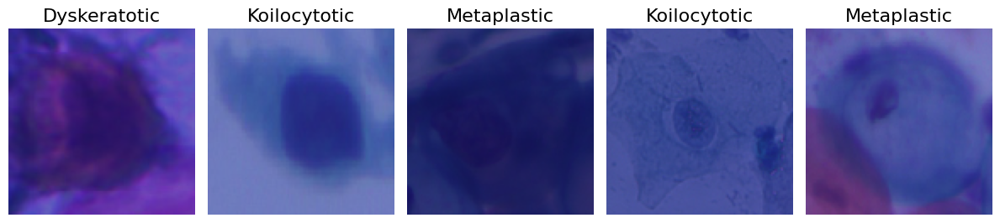

In [114]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(CS_densenet, model_modifier=replace2linear,clone=False)

# Generate heatmap with GradCAM++
grad_cam = gradcam(score, X, penultimate_layer=595)
# Render
#for i, title in enumerate(image_titles):
#    heatmap2 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)

f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap2 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap2, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

2/2 [==============================] - 2s 1s/step


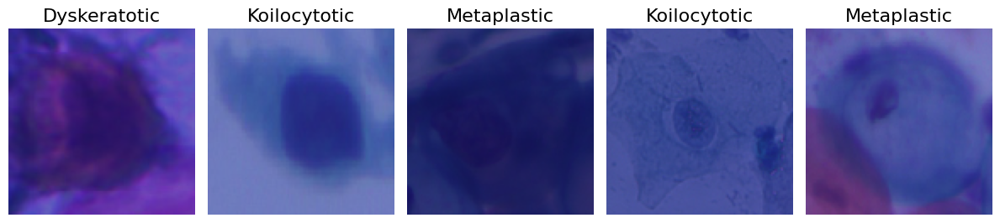

In [115]:
from tf_keras_vis.scorecam import Scorecam
# Create ScoreCAM object
scorecam = Scorecam(CS_densenet)

# Generate heatmap with Faster-ScoreCAM
grad_cam = scorecam(score,X,penultimate_layer=595,max_N=10)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap3 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap3, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

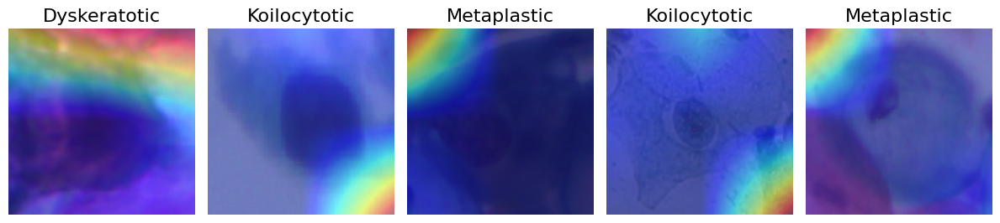

In [116]:
from tf_keras_vis.layercam import Layercam

layercam = Layercam(CS_densenet, model_modifier=replace2linear,clone = False)

# Generate heatmap with Faster-ScoreCAM
grad_cam = layercam(score,X,penultimate_layer=595)

# Render
f, ax = plt.subplots(nrows=1, ncols=5, figsize=(12, 4))
for i, title in enumerate(selected_labels):
    heatmap5 = np.uint8(cm.jet(grad_cam[i])[..., :3] * 255)
    ax[i].set_title(selected_labels[i], fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap5, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [117]:
from skimage import io
from skimage import transform
from tensorflow.keras.preprocessing import image
from skimage.util import img_as_float
def preprocess_img(img):
    img = img_as_float(img)
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return img

selected_images = []
selected_labels = []
for idx in selected_indices:
    img = x_test[idx]
    label = y_test[idx].item()
    img = preprocess_img(img)
    selected_images.append(img)
    selected_labels.append(label)

selected_images = np.vstack(selected_images)
selected_labels = np.array(selected_labels)

preds = CS_densenet.predict(selected_images)
probabilities = np.max(preds, axis=1)

for i in range(len(selected_indices)):
    print(f"Image {selected_indices[i]} - Label: {selected_labels[i]}, Probability: {probabilities[i]}")


1/1 [==============================] - 0s 228ms/step
Image 17 - Label: 0, Probability: 2.156200885772705
Image 174 - Label: 1, Probability: 2.268634080886841
Image 430 - Label: 2, Probability: 2.2013769149780273
Image 254 - Label: 1, Probability: 2.2015202045440674
Image 457 - Label: 2, Probability: 2.104328155517578


1/1 [==============================] - 0s 88ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 75ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 91ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 391ms/step


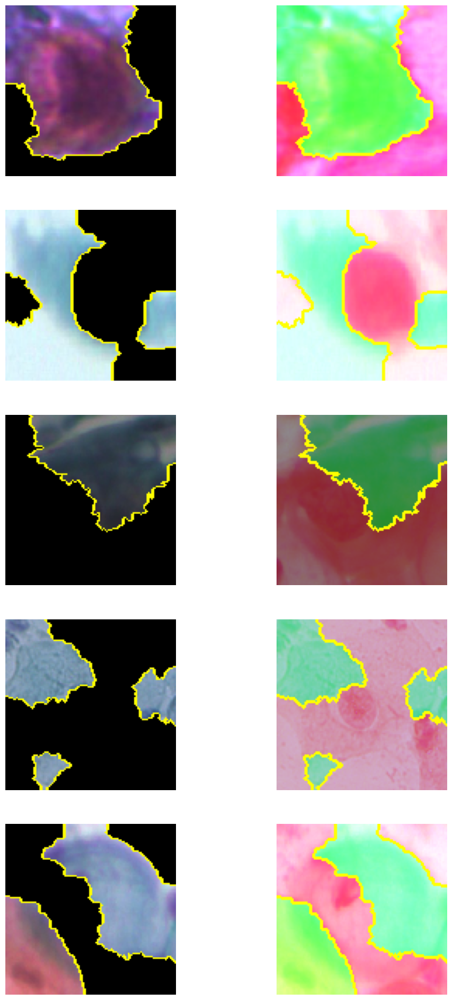

In [118]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

explainer = lime_image.LimeImageExplainer()

fig, axes = plt.subplots(5, 2, figsize=(12, 24))

for i, idx in enumerate(selected_indices):
    img = x_test[idx]
    label = y_test[idx]
    img = preprocess_img(img)
    preds = CS_densenet.predict(img)
    explanation = explainer.explain_instance(img[0].astype('double'), CS_densenet.predict, top_labels=5, hide_color=0, num_samples=1000)
    temp_1, mask1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
    temp_2, mask2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    ax1 = axes[i][0]
    ax2 = axes[i][1]
    ax1.imshow(mark_boundaries(temp_1, mask1))
    ax2.imshow(mark_boundaries(temp_2, mask2))
    ax1.axis('off')
    ax2.axis('off')

plt.show()
